# Analyzing Criminal Activity Across Los Angeles

## Overview

This project is one of my first full-length data analytics endeavors. It technically began in college when I stumbled across a dataset called "Arrest Data from 2010 to 2019". I used this dataset to construct a simple Machine Learning web app for a course project, but I knew there was so much more information that can be extracted from this dataset. Since I decided to continue on the path to become a data analyst, I spent a lot of time working with data relevant to this particular topic.

Even before enrolling at USC, I noticed the university has a stigma of being unsafe for being located in a crime-heavy area of LA, which is why the importance this project really stuck with me. Throughout this project, I tried to identify which areas in LA are relatively less safe using public data on criminal and polic activity provided by the LAPD.

The notebook below is the final presentation of my analysis. The data, code, and visualizations are all cleaned and streamlined. The brainstorming and messy data cleaning process can be found in the notebook "LA_Crime_Exploratory".

In [1]:
import os
import os.path
import json
import math
import numpy as np
import pandas as pd
import datetime as dt
from datetime import datetime, timedelta
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud as wc
from PIL import Image
from IPython.display import display

plt.style.use('dark_background')
pd.set_option('display.max_columns', None)

## Data Collection

The Los Angeles Police Department (LAPD) publishes and regularly maintains two datasets relating to crime in LA. One dataset documents information from all arrest reports and the other documents information from crime reports. While the two datasets are independent from each other, they most likely contain overlapping information (often criminal activity is reported to the police and results in arrests being made). 

Each dataset has two segments: data from 2010-2019, and data from 2020 onwards (which is constantly updated).

Note: The Los Angeles County Sheriff's Department (LASD) is a separate law enforcement entity operating in LA County (which includes LA City). While the LAPD has jurisdiction in the city of LA, certain parts of the city (such as some suburbs) are under the jurisdiction of LASD instead (this is why a map of the LAPD jurisdiction appear to have "holes" in them across the city). Furthermore, the two agencies will have some joint/overlapping cases and operations by proximity. Therefore, while these datasets are provided by the LAPD, it might not include 100% of police data in LA City. The LASD collects and maintains their own data on crime and arrests.

Since the focus of this exploration is to compare the safety of different geographic regions within LA (divided based on location of LAPD stations), it makes sense to normalize metrics across these regions using land size and population size. 

The area and population data are gathered from https://www.lapdonline.org/find-your-local-police-station/. Each of the 21 LAPD stations listed the approximate population and land size of their jurisdiction. Some division did not list such information, so they were approximated using total land size and city-wide population. Info on Olympic gathered from https://www.city-facts.com/olympic-park-los-angeles.

Note: The accuracy of the population sizes won't be high since there is no documentaiton on when and how often the figures are updated. The sum of the population data is 4.3 million, while the census data is around 3.9 million.

In [2]:
# Load datasets
arrest_2019 = pd.read_csv("Arrest_Data_from_2010_to_2019.csv")
crime_2019 = pd.read_csv("Crime_Data_from_2010_to_2019.csv")
arrest_2020 = pd.read_csv("Arrest_Data_from_2020_to_Present.csv")
crime_2020 = pd.read_csv("Crime_Data_from_2020_to_Present.csv")

# Combine pre-2020 data with post-2020 data
arrest = pd.concat([arrest_2019, arrest_2020], ignore_index=True)
crime = pd.concat([crime_2019, crime_2020], ignore_index=True)

C:\Users\chiuy\AppData\Local\Temp/ipykernel_10064/924006125.py:2: DtypeWarning: Columns (21,23) have mixed types. Specify dtype option on import or set low_memory=False.
  arrest_2019 = pd.read_csv("Arrest_Data_from_2010_to_2019.csv")


In [3]:
# Hard code area and population info
area_pop = pd.DataFrame({"Area":crime["AREA NAME"].unique()})
area_pop.set_index("Area", inplace=True)
area_pop["Population"] = ""
area_pop["SqMile"] = ""
area_pop.loc["77th Street", "Population"] = 175000
area_pop.loc["77th Street", "SqMile"] = 11.9
area_pop.loc["Central", "Population"] = 40000
area_pop.loc["Central", "SqMile"] = 4.5
area_pop.loc["Devonshire", "Population"] = 219136
area_pop.loc["Devonshire", "SqMile"] = 48.31
area_pop.loc["Foothill", "Population"] = 182214
area_pop.loc["Foothill", "SqMile"] = 46.13
area_pop.loc["Harbor", "Population"] = 171000
area_pop.loc["Harbor", "SqMile"] = 27
area_pop.loc["Hollenbeck", "Population"] = 200000
area_pop.loc["Hollenbeck", "SqMile"] = 15.2
area_pop.loc["Hollywood", "Population"] = 300000
area_pop.loc["Hollywood", "SqMile"] = 17.2
area_pop.loc["Mission", "Population"] = 225849
area_pop.loc["Mission", "SqMile"] = 25.1
area_pop.loc["N Hollywood", "Population"] = 220000
area_pop.loc["N Hollywood", "SqMile"] = 25
area_pop.loc["Newton", "Population"] = 187739
area_pop.loc["Newton", "SqMile"] = 11.25
area_pop.loc["Northeast", "Population"] = 250000
area_pop.loc["Northeast", "SqMile"] = 29
area_pop.loc["Olympic", "Population"] = 17558
area_pop.loc["Olympic", "SqMile"] = 7
area_pop.loc["Pacific", "Population"] = 200000
area_pop.loc["Pacific", "SqMile"] = 25.74
area_pop.loc["Rampart", "Population"] = 164961
area_pop.loc["Rampart", "SqMile"] = 5.54
area_pop.loc["Southeast", "Population"] = 150000
area_pop.loc["Southeast", "SqMile"] = 10.2
area_pop.loc["Southwest", "Population"] = 165000
area_pop.loc["Southwest", "SqMile"] = 13.11
area_pop.loc["Topanga", "Population"] = 430961
area_pop.loc["Topanga", "SqMile"] = 18.37
area_pop.loc["Van Nuys", "Population"] = 325000
area_pop.loc["Van Nuys", "SqMile"] = 30
area_pop.loc["West LA", "Population"] = 228000
area_pop.loc["West LA", "SqMile"] = 65.14
area_pop.loc["West Valley", "Population"] = 196840
area_pop.loc["West Valley", "SqMile"] = 33.5
area_pop.loc["Wilshire", "Population"] = 251000
area_pop.loc["Wilshire", "SqMile"] = 13.97

## Data Cleaning

The section below includes all the code used to clean both datasets. They are very similar, but certain differences (such as original naming conventions, categorical labels, etc.) are addressed differently. Read in-line comments (lines starting with #) for further explanation.

In [4]:
# This function rounds the time to the nearest 15 minutes. Input "time" must be an integer between 0
# and 2400. E.g. 1115, 2107
def round_to_15(time):
    if math.isnan(time) == True:
        return(time)
    elif time > 100:
        hour = float(str(int(time))[:-2])*100
    else:
        hour = 0
    minutes = float(str(int(time))[-2:])
    rounded = round(minutes/15)*15
    if rounded == 60:
        rounded = 0
        hour += 100
    final = hour + rounded
    if final == 2400:
        final = 0
    return(final)

In [5]:
# Cleaning arrest data
arrest_clean = arrest.copy()

# Standardizing feature naming convention
for title in arrest_clean.columns:
    arrest_clean.rename(columns={title: title.upper().replace(" ", "_")}, inplace=True)

# Removing unnecessary features (columns). They are deemed unnecessary for this project, either
# because they are redundant information or do not add insight to the analysis.
arrest_clean = arrest_clean.drop(arrest_clean[["REPORT_TYPE", "AREA_ID", "REPORTING_DISTRICT", "DESCENT_CODE", 
                         "CHARGE_GROUP_CODE", "ARREST_TYPE_CODE", "CHARGE", "DISPOSITION_DESCRIPTION", 
                         "BOOKING_DATE", "LOCATION", "BOOKING_LOCATION", "BOOKING_TIME", 
                         "BOOKING_LOCATION_CODE"]], axis=1)

# Addressing missing data
arrest_clean["CHARGE_GROUP_DESCRIPTION"].fillna("Unknown", inplace=True)
arrest_clean["CHARGE_DESCRIPTION"].fillna("UNKNOWN", inplace=True)
arrest_clean["CROSS_STREET"].fillna("N/A", inplace=True)
arrest_clean.dropna(how="any", axis=0, inplace=True)
arrest_clean.reset_index(drop=True, inplace=True)

# Convert to proper datetime format
arrest_clean["ARREST_DATE"] = pd.to_datetime(arrest_clean["ARREST_DATE"], format="mixed")

# Create separate columns for year, month, and day
arrest_clean["YEAR"] = list(y.year for y in arrest_clean["ARREST_DATE"])
arrest_clean["MONTH"] = list(y.month for y in arrest_clean["ARREST_DATE"])
arrest_clean["DAY"] = list(y.day for y in arrest_clean["ARREST_DATE"])

# Round time of day to nearest 15 minutes
time = arrest_clean["TIME"]
rounded = list(round_to_15(a) for a in time)
arrest_clean["TIME"] = rounded

# Identify day of week for each date
date = list(arrest_clean["ARREST_DATE"])
weekday = list(a.weekday() + 1 for a in date) # .weekday() returns 0 (Monday) to 6 (Sunday). 
                                              # I want to represent Monday as 1 and Sunday as 7.
arrest_clean["WEEKDAY"] = weekday

# Feature creation (age group) through manual bucketization
age_group = []
age = arrest_clean["AGE"]
for i in range(len(age)):
    if age[i]<18:
        age_group.append("Minor")
    elif age[i]>=65:
        age_group.append("Senior")
    else:
        age_group.append("Adult") 
# I originally had a separate group for every 4 years (e.g. "18-21"), but decided detailed age grouping
# is unnecessary since accurate age is already present.
arrest_clean["AGE_GROUP"] = age_group

# Separate data into "day" (5AM-5PM) and "night" (5PM-5AM)
day_night = []
time = arrest_clean["TIME"]
for i in range(len(time)):
    if time[i]< 500 or time[i]>=1700:
        day_night.append("Night")
    else:
        day_night.append("Daytime")
arrest_clean["DAY_NIGHT"] = day_night

arrest_clean.rename(columns={"REPORT_ID": "ARREST_ID", "ARREST_DATE": "DATE", "SEX_CODE": "SEX", "CHARGE_GROUP_DESCRIPTION": "CRIME_GROUP"},
                    inplace=True)

In [6]:
# Cleaning crime data
crime_clean = crime.copy()

# Standardizing feature naming convention
for title in crime_clean.columns:
    crime_clean.rename(columns={title: title.upper().replace(" ", "_")}, inplace=True)
crime_clean.rename(columns={"AREA_": "AREA"}, inplace=True)

# Removing unnecessary features (columns). They are deemed unnecessary for this project, either
# because they are redundant information or do not add insight to the analysis.
# MOCODES can be translated into text desc of modus operandi via code description file (found online). 
# However, it is likely unnecesary for this project, and each report can contain multiple MO so analysis
# would be inefficient. Therefore it was removed
crime_clean.drop(["AREA", "PART_1-2", "RPT_DIST_NO", "CRM_CD", "MOCODES", "PREMIS_CD", "WEAPON_USED_CD", "STATUS", 
                  "CRM_CD_1", "CRM_CD_2", "CRM_CD_3", "CRM_CD_4"], axis=1, inplace=True)

# So unlike the arrests dataset, the crimes dataset does not have a more general "crime groups" field. 
# The specific "crime desription" field includes 142 unique crimes, which is too many categories to 
# efficiently visualize (and many crime descriptions are hard to understand at first 
# glance without consulting further documentation). Therefore, I manually assigned each crime
# description to the closest "crime group" (matching the arrests dataset) using a separate spreadsheet.
crime_groups = pd.read_csv("crime_groups.csv") # Manually sorted crime groups
crime_groups.rename(columns={"Desc": "CRM_CD_DESC"}, inplace=True)
crime_clean = crime_clean.merge(crime_groups, on="CRM_CD_DESC", how="left")
crime_clean.rename(columns={"Group":"CRM_GROUP"}, inplace=True)

# Replace the single letter victim descent code with proper description obtained from documentation.
descent_codes = pd.read_csv("crime_vict_descent_code.csv")
crime_clean = crime_clean.merge(descent_codes, on="VICT_DESCENT", how="left")
crime_clean.drop("VICT_DESCENT", axis=1, inplace=True)
crime_clean.rename(columns={"DESCENT":"VICT_DESCENT"}, inplace=True)

crime_clean["CROSS_STREET"] = crime_clean["CROSS_STREET"].fillna("N/A")

# Victim Sex and Victim Ethnicity have a very similar number of missing values. At first I thought
# the missing values were caused by entry error but the frequency is too high.
# Looking at the crime group distribution for these missing entries show that while some of the crimes 
# should have immedietely identifiable victims (e.g. assault, kidnapping), the majority of the crimes 
# belong to "vehicle theft" and "larceny", which can be reported without knowning who the victim is. 
# This is under the assumnption that the cases are recorded as soon as reports are received, and 
# therefore the victims are not identified yet. 
crime_clean["VICT_DESCENT"].fillna("X", inplace=True)
crime_clean["VICT_SEX"].fillna("X", inplace=True)

# Victim sex should only have 3 possible options (F, M, X) according to the documentaiton, but 
# here there are 6 unique values. The 3 extra are very few in frequency, so I will assume they are
# typos and change them to X (unknown).
crime_clean["VICT_SEX"].replace(["-", "H", "N"], "X", inplace=True)
crime_clean["PREMIS_DESC"].fillna("UNKNOWN", inplace=True)
crime_clean["WEAPON_DESC"].fillna("NONE", inplace=True)

# A large number of crimes reported with 0 or negative victim age for some reason. Without detailed
# probing, I suspect it is a mixture of correct data (e.g. crime against children under the age of 1)
# and incorrect data (victim was unidentified, misidentified, or error during data entry). 
# Here they are all set to 0 because it doesn't make sense to drop such a large portion of the dataset,
# but these data points should be ignored when calculating statistics such as mean victim age to not
# incorrectly skew the results.
crime_clean["VICT_AGE"].replace(crime_clean[(crime_clean["VICT_AGE"]<0)]["VICT_AGE"].unique(), 0, 
                                inplace=True)

# Convert to proper datetime format
crime_clean["DATE_RPTD"] = pd.to_datetime(crime_clean["DATE_RPTD"], format="mixed")
crime_clean["DATE_OCC"] = pd.to_datetime(crime_clean["DATE_OCC"], format="mixed")

# Create separate columns for year, month, and day
crime_clean["OCC_YEAR"] = list(y.year for y in crime_clean["DATE_OCC"])
crime_clean["OCC_MONTH"] = list(y.month for y in crime_clean["DATE_OCC"])
crime_clean["OCC_DAY"] = list(y.day for y in crime_clean["DATE_OCC"])

# Round time of day to nearest 15 minutes
time = crime_clean["TIME_OCC"]
rounded = list(round_to_15(a) for a in time)
crime_clean["TIME_OCC"] = rounded

# Identify day of week for each date
date = list(crime_clean["DATE_OCC"])
weekday = list(a.weekday() + 1 for a in date) # .weekday() returns 0 (Monday) to 6 (Sunday). 
                                              # I want to represent Monday as 1 and Sunday as 7.
crime_clean["WEEKDAY_OCC"] = weekday

# Feature creation (age group) through manual bucketization
age_group = []
age = crime_clean["VICT_AGE"]
for i in range(len(age)):
    if age[i]==0:
        age_group.append("Unknown")
    elif age[i]>0 and age[i]<18:
        age_group.append("Minor")
    elif age[i]>=65:
        age_group.append("Senior")
    else:
        age_group.append("Adult")
# I originally had a separate group for every 4 years (e.g. "18-21"), but decided detailed age grouping
# is unnecessary since accurate age is already present.
crime_clean["AGE_GROUP"] = age_group

# Separate data into "day" (5AM-5PM) and "night" (5PM-5AM)
day_night = []
time = crime_clean["TIME_OCC"]
for i in range(len(time)):
    if time[i]< 500 or time[i]>=1700:
        day_night.append("NIGHT")
    else:
        day_night.append("DAYTIME")
crime_clean["DAY_NIGHT"] = day_night

crime_clean.rename(columns={"DR_NO": "CRIME_ID", "DATE_OCC": "DATE", "TIME_OCC": "TIME", "WEEKDAY_OCC": "WEEKDAY",
                            "VICT_AGE": "AGE", "VICT_SEX": "SEX", "CRM_GROUP": "CRIME_GROUP",
                            "OCC_YEAR": "YEAR", "OCC_MONTH": "MONTH", "OCC_DAY": "DAY"}, inplace=True)


## Exploration

In [7]:
crime_clean.head(5)

,CRIME_ID,DATE_RPTD,DATE,TIME,AREA_NAME,CRM_CD_DESC,AGE,SEX,PREMIS_DESC,WEAPON_DESC,STATUS_DESC,LOCATION,CROSS_STREET,LAT,LON,CRIME_GROUP,VICT_DESCENT,YEAR,MONTH,DAY,WEEKDAY,AGE_GROUP,DAY_NIGHT
0,1307355,2010-02-20,2010-02-20,1345.0,Newton,VIOLATION OF COURT ORDER,48,M,SINGLE FAMILY DWELLING,NONE,Adult Arrest,300 E GAGE AV,N/A,33.9825,-118.2695,Miscellaneous Other Violations,Hispanic,2010,2,20,6,Adult,DAYTIME
1,11401303,2010-09-13,2010-09-12,45.0,Pacific,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0,M,STREET,NONE,Invest Cont,SEPULVEDA BL,MANCHESTER AV,33.9599,-118.3962,Miscellaneous Other Violations,White,2010,9,12,7,Unknown,NIGHT
2,70309629,2010-08-09,2010-08-09,1515.0,Newton,OTHER MISCELLANEOUS CRIME,0,M,ALLEY,NONE,Invest Cont,1300 E 21ST ST,N/A,34.0224,-118.2524,Miscellaneous Other Violations,Hispanic,2010,8,9,1,Unknown,DAYTIME
3,90631215,2010-01-05,2010-01-05,145.0,Hollywood,VIOLATION OF COURT ORDER,47,F,STREET,HAND GUN,Invest Cont,CAHUENGA BL,HOLLYWOOD BL,34.1016,-118.3295,Miscellaneous Other Violations,White,2010,1,5,2,Adult,NIGHT
4,100100501,2010-01-03,2010-01-02,2100.0,Central,"RAPE, ATTEMPTED",47,F,ALLEY,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",Invest Cont,8TH ST,SAN PEDRO ST,34.0387,-118.2488,Rape,Hispanic,2010,1,2,6,Adult,NIGHT


In [8]:
arrest_clean.head(5)

,ARREST_ID,DATE,TIME,AREA_NAME,AGE,SEX,CRIME_GROUP,CHARGE_DESCRIPTION,ADDRESS,CROSS_STREET,LAT,LON,YEAR,MONTH,DAY,WEEKDAY,AGE_GROUP,DAY_NIGHT
0,121920046,2012-09-28,930.0,Mission,60,M,Unknown,UNKNOWN,7600 WOODMAN AV,N/A,34.2111,-118.4309,2012,9,28,5,Adult,Daytime
1,90712341,2011-03-10,945.0,Wilshire,45,M,Drunkeness,DRINKING IN PUBLIC,4500 W WASHINGTON BL,N/A,34.0399,-118.3375,2011,3,10,4,Adult,Daytime
2,121909585,2012-04-01,1715.0,Mission,37,M,Unknown,UNKNOWN,8100 SEPULVEDA PL,N/A,34.2208,-118.4662,2012,4,1,7,Adult,Night
3,100109543,2010-04-14,1515.0,Central,38,F,Prostitution/Allied,LOITER:INTENT:PROSTITUTION,7TH,TOWNE AV,34.0395,-118.2405,2010,4,14,3,Adult,Daytime
4,100208368,2010-03-18,2115.0,Rampart,40,F,Miscellaneous Other Violations,ESCORT WITHOUT PERMIT,1900 W OLYMPIC BL,N/A,34.0508,-118.2777,2010,3,18,4,Adult,Night


Text(0.5, 1.0, 'Monthly Data, Total Crime/Arrest')

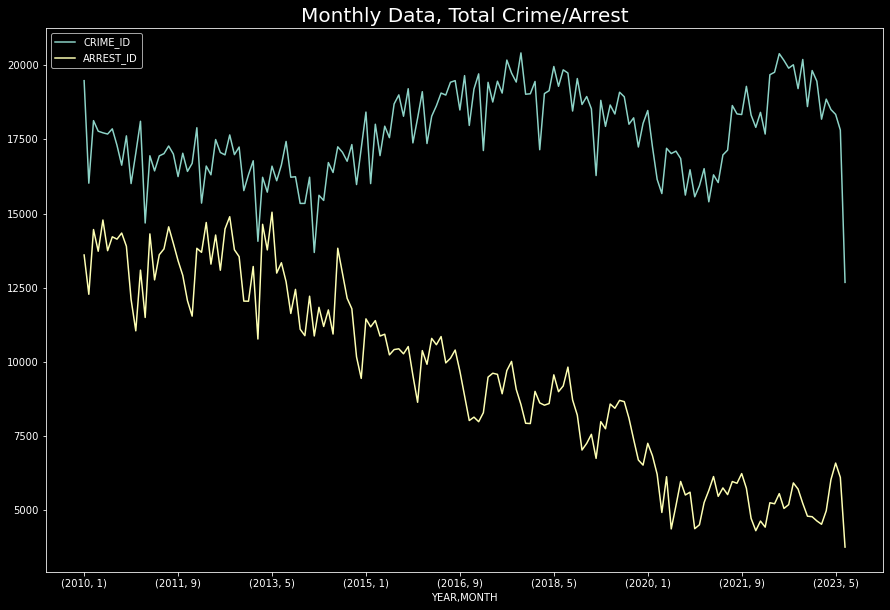

In [9]:
by_date = pd.concat([crime_clean.groupby(by=["YEAR", "MONTH"])["CRIME_ID"].count(), 
           arrest_clean.groupby(by=["YEAR", "MONTH"])["ARREST_ID"].count()], axis=1, join="inner")
by_date.plot(figsize=(15, 10))
plt.title("Monthly Data, Total Crime/Arrest", size=20)

The figure above shows monthly data from 2010 to July 2023 (when the dataset was acquired). There are generally more crime reports than arrest reports since some crimes have no clear perpetrator or said perpetrators were never caught. 

Since around 2014, monthly arrests began declining steadily while reported crimes began increasing. In reports such as https://xtown.la/2020/01/16/lapd-making-almost-half-as-many-arrests-as-a-decade-ago/, it was speculated that changes in Californian criminal law affected the crime rates while changes in LAPD's "approach to policing", and possibly reporting methodology, caused the decrease in arrests.

There is also a sharp decline in both during the start of 2020, most likely due to COVID-19 lockdowns, but crime rate has since rebounded more than arrest rates, reflecting the challenges that police officers may have faced during a pandemic.

Text(0.5, 0, 'Occurance')

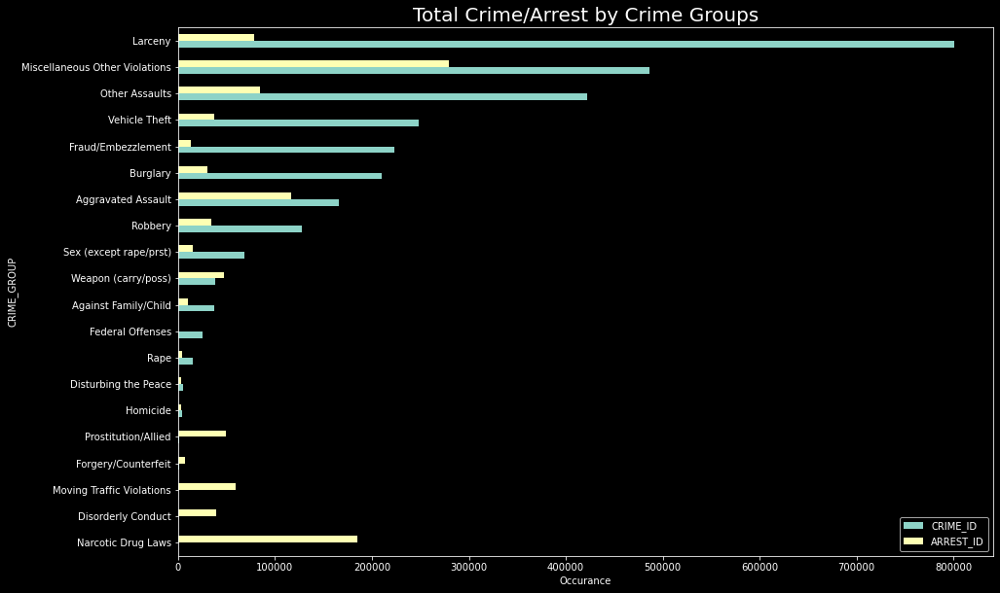

In [10]:
by_crime_group = pd.concat([crime_clean.groupby(by=["CRIME_GROUP"])["CRIME_ID"].count(), 
           arrest_clean.groupby(by=["CRIME_GROUP"])["ARREST_ID"].count()], axis=1, join="inner")
by_crime_group.sort_values(by="CRIME_ID", inplace=True)
by_crime_group.plot(kind="barh", figsize=(15, 10))
plt.title("Total Crime/Arrest by Crime Groups", size=20)
plt.xlabel("Occurance")

The bar chart above shows the difference between reported crime and arrests across different types of criminal activities. For most categories, the number of reported crime is significantly greater than the number of arrests, the reason of which is explored with the graph above. On the other hand, most groups in which arrests are greater than reported crime (prostitution, forgery, etc.) have almost no records of reported crime. They can be classified as "in the moment" arrests because arrests are typically made when the police catch the crime as it happens and not after a report is filed. It is also worth noting that the more serious a crime is (aggravated assault, weapons posession, homicide), the closer the number of arrests are to the number of reports.

It is clear that neither dataset tells the full story of criminal activity in LA (pertaining to crimes handled by the LAPD). Since the datasets are independent (they do not share a primary key such as incident ID), it is almost impossible to tell which cases are overlapping (a reported crime that results an arrest by the LAPD). However, for the sake of simplifying this project, I will focus on the reported crimes dataset (crime_clean) when making my evaluation. This is because the goal of this analysis is to determine the public safety level of different regions in LA, and reported crime not only has more data, but should also theoretically paint a more accurate picture of the differences between dangerous and relatively safe criminal activity that has happened. The arrests dataset will still be referenced to help provide more insight on certain aspects of the analysis.

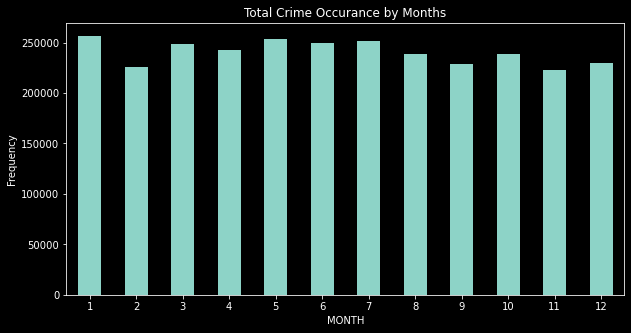

In [11]:
crime_clean.groupby("MONTH")["CRIME_ID"].count().plot(kind="bar", figsize=(10, 5))
plt.ylabel("Frequency")
plt.xticks(rotation=0)
plt.title("Total Crime Occurance by Months")
plt.show()

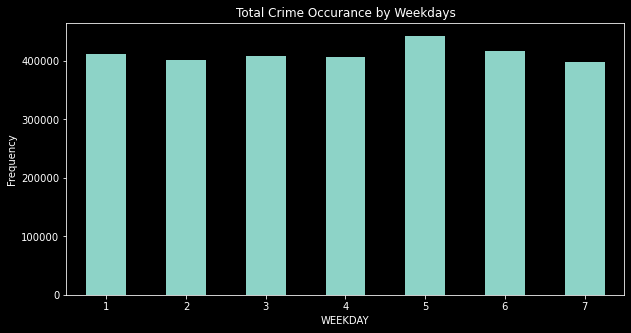

In [12]:
crime_clean.groupby("WEEKDAY")["CRIME_ID"].count().plot(kind="bar", figsize=(10, 5))
plt.ylabel("Frequency")
plt.xticks(rotation=0)
plt.title("Total Crime Occurance by Weekdays")
plt.show()

Reported crime is quite consistent across months as well as days in the week.

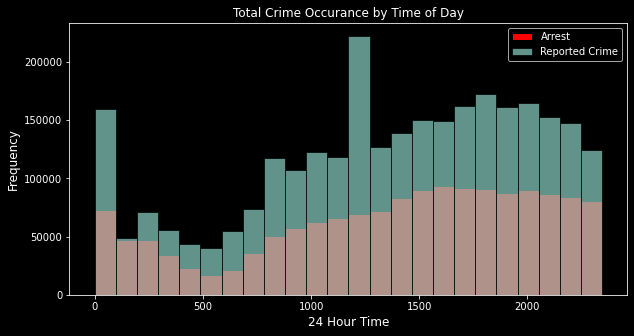

In [13]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(arrest_clean["TIME"], bins=24, edgecolor="black",
       label="Arrest", color="red")
ax.hist(crime_clean["TIME"], bins=24, edgecolor="black", alpha=0.7,
       label="Reported Crime")
ax.legend()
ax.set_title("Age Distribution of Crime in Different Areas of LA", size=15)
ax.set_xlabel("Age", size=12)
ax.set_ylabel("Freq", size=12)
plt.ylabel("Frequency")
plt.xlabel("24 Hour Time")
plt.xticks(rotation=0)
plt.title("Total Crime Occurance by Time of Day")
plt.show()

Reported crime and arrest rates follow very similar trends across hours of the day. There is a large spike in reported crime between 12-1PM. Interestingly, crime and arrest rates decline significantly after 1AM and does not pick up until around 6AM. Whether this data accurately reflects the trend in criminal activity is questionable since it is possible that crimes are simply not being reported and responded to during these hours.

In [14]:
# Normalize reported crime and arrests data with the land mass and population of each area.
crime_by_area = crime_clean.groupby("AREA_NAME")["CRIME_ID"].count()
arrest_by_area = arrest_clean.groupby("AREA_NAME")["ARREST_ID"].count()

area_info = pd.concat([crime_by_area, arrest_by_area, area_pop], axis=1).reset_index()
area_info.rename(columns={"index": "Area", "CRIME_ID": "Total_Crime", 
                          "ARREST_ID": "Total_Arrest"}, inplace=True)

for i in range(len(area_info)):
    area_info.loc[i, "Pop_Density"] = area_info.loc[i, "Population"]/area_info.loc[i, "SqMile"]
    area_info.loc[i, "Crimes_Per_Capita"]=area_info.loc[i, "Total_Crime"]/area_info.loc[i, "Population"]
    area_info.loc[i, "Crimes_Per_SqMile"]=area_info.loc[i, "Total_Crime"]/area_info.loc[i, "SqMile"]
    area_info.loc[i, "Crimes_By_Pop_Density"]=area_info.loc[i, "Total_Crime"]/area_info.loc[i, "Pop_Density"]
    area_info.loc[i, "Arrests_Per_Capita"]=area_info.loc[i, "Total_Arrest"]/area_info.loc[i, "Population"]
    area_info.loc[i, "Arrests_Per_SqMile"]=area_info.loc[i, "Total_Arrest"]/area_info.loc[i, "SqMile"]
    area_info.loc[i, "Arrests_By_Pop_Density"]=area_info.loc[i, "Total_Arrest"]/area_info.loc[i, "Pop_Density"]
    
area_info.set_index("Area", inplace=True)

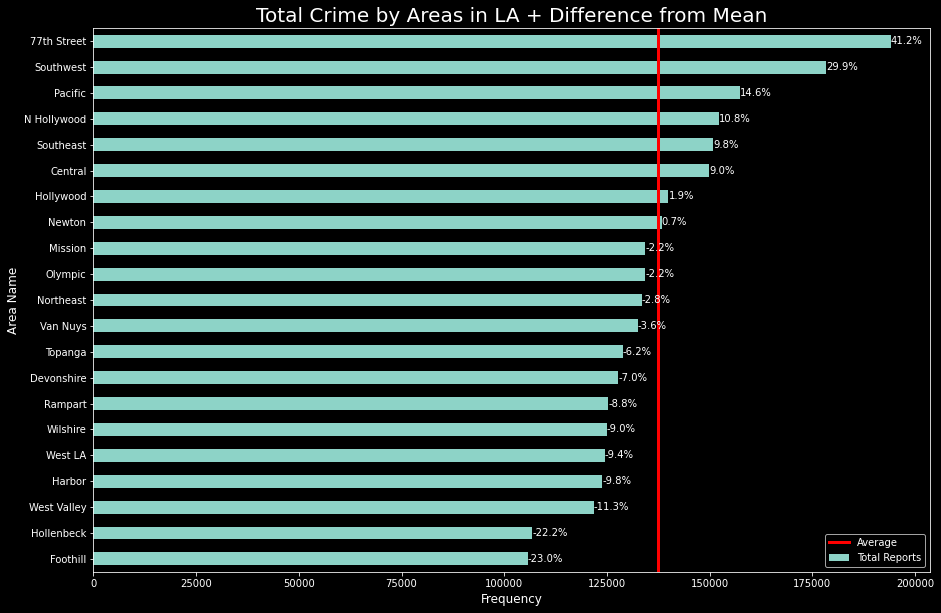

In [15]:
by_area = area_info["Total_Crime"]
barp = by_area.sort_values(ascending=True).plot(kind="barh", label="Total Reports", figsize=(15, 10))
areas_mean = area_info["Total_Crime"].mean()
plt.axvline(areas_mean, color="r", label="Average", linewidth=3)
pctdiff = []
for a in range(21):
    pctdiff.append(str(round((by_area.sort_values(ascending=True)[a]-areas_mean)/
                             areas_mean*100, 1))+"%")
plt.bar_label(barp.containers[0], labels=pctdiff, size=10)
plt.legend()
plt.xlabel("Frequency", size=12)
plt.ylabel("Area Name", size=12)
plt.title("Total Crime by Areas in LA + Difference from Mean", size=20)
plt.show()

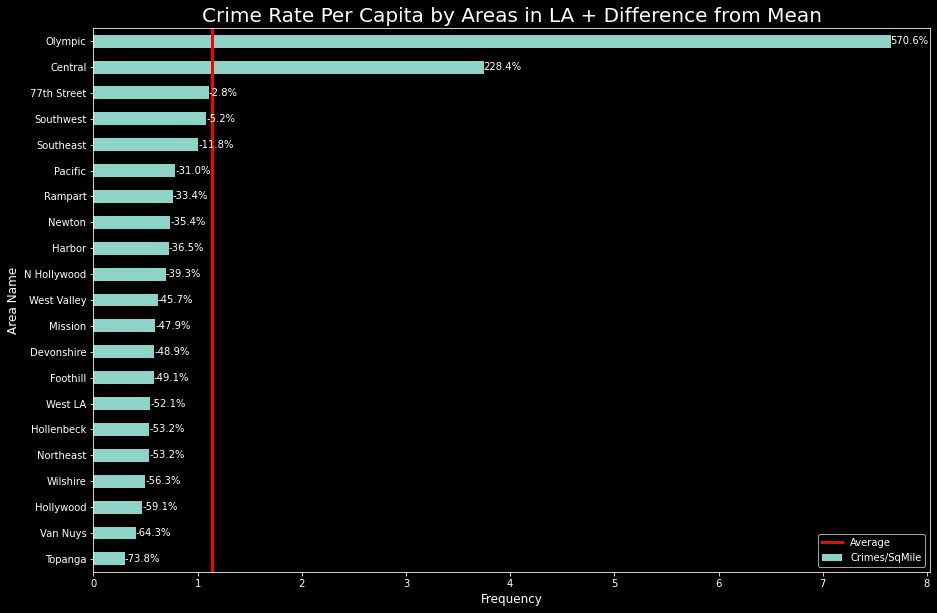

In [16]:
by_pop = area_info["Crimes_Per_Capita"]
barp = by_pop.sort_values(ascending=True).plot(kind="barh", label="Crimes/SqMile", figsize=(15, 10))
areas_mean = area_info["Crimes_Per_Capita"].mean()
plt.axvline(areas_mean, color="r", label="Average", linewidth=3)
pctdiff = []
for a in range(21):
    pctdiff.append(str(round((by_pop.sort_values(ascending=True)[a]-areas_mean)/
                             areas_mean*100, 1))+"%")
plt.bar_label(barp.containers[0], labels=pctdiff, size=10)
plt.legend()
plt.xlabel("Frequency", size=12)
plt.ylabel("Area Name", size=12)
plt.title("Crime Rate Per Capita by Areas in LA + Difference from Mean", size=20)
plt.show()

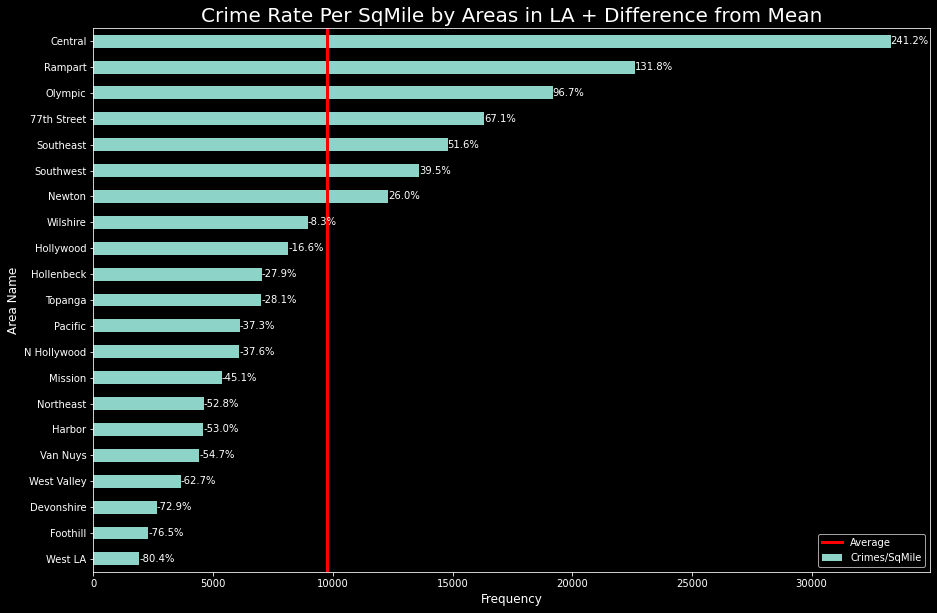

In [17]:
by_land = area_info["Crimes_Per_SqMile"]
barp = by_land.sort_values(ascending=True).plot(kind="barh", label="Crimes/SqMile", figsize=(15, 10))
areas_mean = area_info["Crimes_Per_SqMile"].mean()
plt.axvline(areas_mean, color="r", label="Average", linewidth=3)
pctdiff = []
for a in range(21):
    pctdiff.append(str(round((by_land.sort_values(ascending=True)[a]-areas_mean)/
                             areas_mean*100, 1))+"%")
plt.bar_label(barp.containers[0], labels=pctdiff, size=10)
plt.legend()
plt.xlabel("Frequency", size=12)
plt.ylabel("Area Name", size=12)
plt.title("Crime Rate Per SqMile by Areas in LA + Difference from Mean", size=20)
plt.show()

The four graphs above provide different ways to look at crime rates in the regions of LA using aggregated data from 2010 to 2022. By total counts of crime, most of the 21 regions are within or round +-10% of the average. 77th Street (+41%) and Southwest (+30%) stand out as regions with high crime. 

However, when accounting for land mass and population, the differences are much more significant. Particularly for crimes/capita , Olympic and Central appears vastly more problematic than the other 19 regions. According to both metrics, the regions closer to downtown Los Angeles and those south of it have high crime rates. These areas typically have higher population density and other social issues associated with the downtown environment. Historically, the regions towards the south of city center (77th Street, Southwest, Southeast, Newton) are associated with high levels of gang activity. On the other hand, the regions furhter out have lower crime rates. These regions generally have much lower population densities and contain more affluent neighbourhoods.

These two metrics, however, both have their inherent proven biases. For example, rate per capita does not account for the travelling population, such as people travelling daily for work as well as tourists (both of which LA has a lot of). The rate per square mile also doesn't reflect the true populaiton density of the regions: for regions with greater land mass such as Foothill and Topanga, there are usually some densly populated pockets mixed with sparsely populated areas (such as mountains). 

Map of LA City provided by the LAPD below.

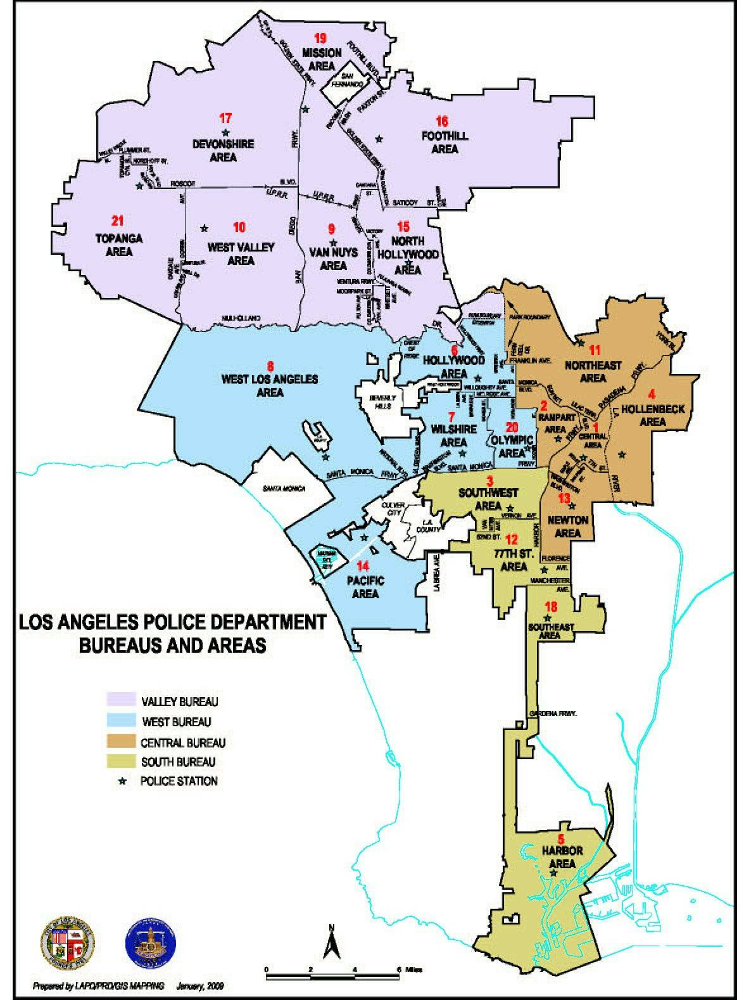

In [18]:
img = Image.open('map.jpg')
display(img)

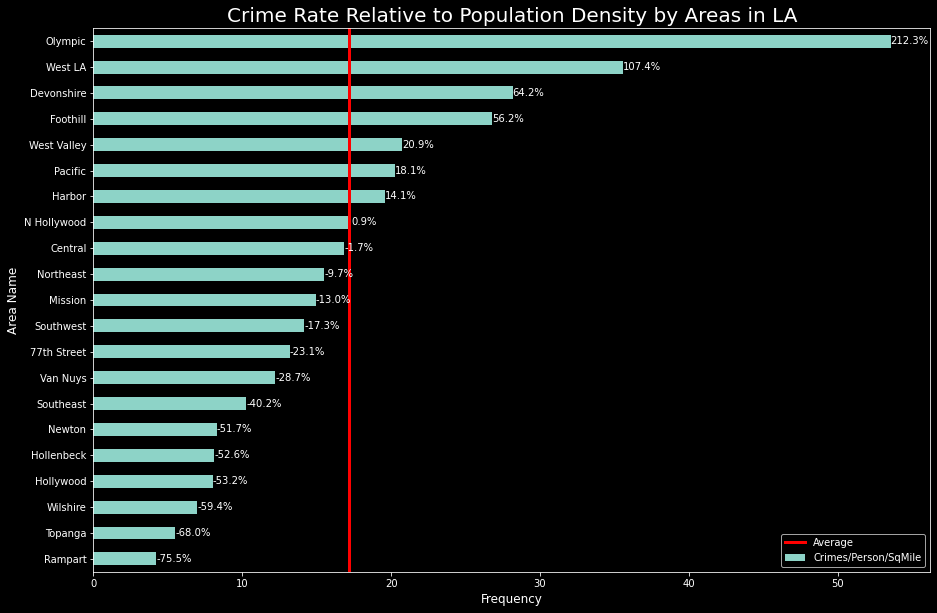

In [19]:
by_pop_density = area_info["Crimes_By_Pop_Density"]
barp = by_pop_density.sort_values(ascending=True).plot(kind="barh", label="Crimes/Person/SqMile", figsize=(15, 10))
areas_mean = area_info["Crimes_By_Pop_Density"].mean()
plt.axvline(areas_mean, color="r", label="Average", linewidth=3)
pctdiff = []
for a in range(21):
    pctdiff.append(str(round((by_pop_density.sort_values(ascending=True)[a]-areas_mean)/
                             areas_mean*100, 1))+"%")
plt.bar_label(barp.containers[0], labels=pctdiff, size=10)
plt.legend()
plt.xlabel("Frequency", size=12)
plt.ylabel("Area Name", size=12)
plt.title("Crime Rate Relative to Population Density by Areas in LA", size=20)
plt.show()

Another way to evaluate crime rates without exmploying extra data is to normalize crime rate using population density. This metric may be a more wholistic way of comparing crime rates across the different regions as it accounts for both population and land mass, and should be useful when estimating the chances of a person encountering crime different parts of LA.

Interestingly the rankings of this metric is drastically different from those in the previous 2 graphs. Many of the previously mentioned "safer" regions that are further out from city center are now at the top of the rankings while some of the more "crowded" regions now have relatively lower rankings. By this metric, This shows that a lower population density is not necessarily associated with relatively lower crime rates. Olympic is an exception here as it is still in first place by a large margin.

Overall the four metrics above and their interpretations should be considered in accordance to each other as they each offer unique insight to the regional distribution of crime across LA.

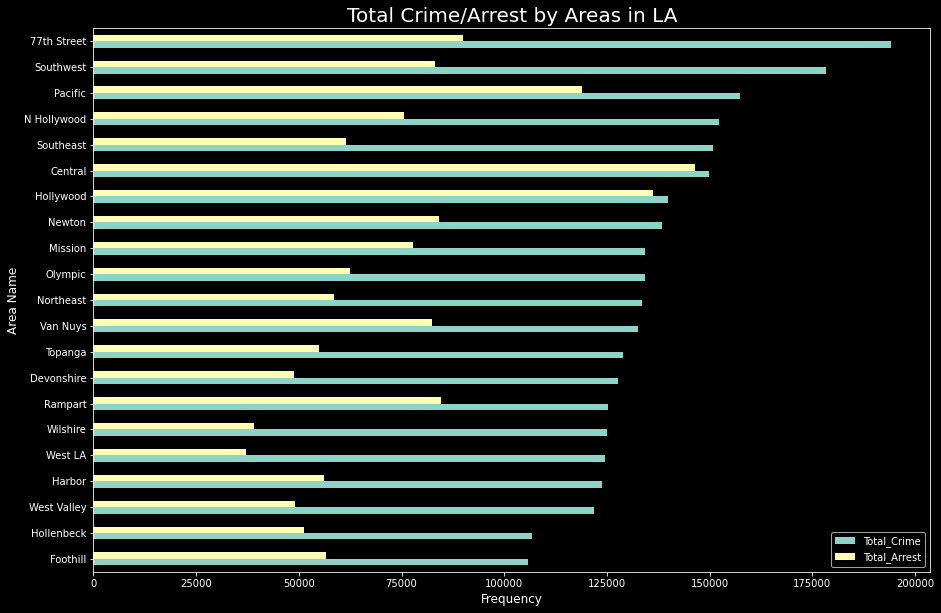

In [20]:
area_info[["Total_Crime", 
                             "Total_Arrest"]].sort_values(by="Total_Crime").plot(kind="barh",
                                                                                figsize=(15, 10))
plt.legend()
plt.xlabel("Frequency", size=12)
plt.ylabel("Area Name", size=12)
plt.title("Total Crime/Arrest by Areas in LA", size=20)
plt.show()

The bar chart above displays total reported crime and arrest data for every region in LA. We can see that for Central and Hollywood, the frequency of arrest is very close to that of reported crime. I hypothesize that is largely because LAPD's patrol activity in these two areas are very high and thus respond to both reported and unreported criminal activity rapidly, resulting in high arrest rates. Central LA is the city center and Hollywood is LA's entertainment center. Based on my personal experience, both are densely populated areas with lots of activity hubs (bars, shops, entertainment venues) and constant streams of tourists, which might be why LAPD is likely to devout more resources in these areas.

In [21]:
# Assigned "danger level" as both categorical and numerical data to each type of crime
danger_level = pd.read_csv("danger_level.csv")
danger_level.rename(columns={"Desc": "CRM_CD_DESC"}, inplace=True)
crime_clean = crime_clean.merge(danger_level, on="CRM_CD_DESC", how="left")
crime_clean.rename(columns={"Potentially_Dangerous/Violent":"DANGER_LEVEL"}, inplace=True)
crime_clean.rename(columns={"Num":"DANGER_LEVEL_NUM"}, inplace=True)

Note: the "danger level" of a crime was assigned based on the description of the crime. "Negligible" (numeric danger level 0) means the crime is not associated with violent of any form. "Low" (numeric danger level 1) means there is a possibility of violence occuring, usually for low levels of conflict or potential encounter between victim and criminal. "Medium" (numeric danger level 2) means there is confirmed acts of violence (including verbal threats), but not likely to result in major damage. "High" (numeric danger level 3) means weapons are involved and/or the results are likely major bodily harm or death.

In [22]:
# Calcualte the average YoY for each region
yoy_total = crime_clean.groupby(["AREA_NAME"])["CRIME_ID"].count()
annual = crime_clean.groupby(["AREA_NAME", "YEAR"])["CRIME_ID"].count().unstack()
annual_midhigh = crime_clean[(crime_clean["DANGER_LEVEL"]=="High") | (crime_clean["DANGER_LEVEL"]=="Medium")].groupby(["AREA_NAME", "YEAR"])["CRIME_ID"].count().unstack()
annual_high = crime_clean[crime_clean["DANGER_LEVEL"]=="High"].groupby(["AREA_NAME", "YEAR"])["CRIME_ID"].count().unstack()

# Calculate YoY for each year
def calc_yoy(df):
    yoy = pd.DataFrame()
    for i in df.index:
        for j in range(2011, 2023):
            yoy.loc[i, j] = round((df.loc[i, j] - df.loc[i, j-1])/df.loc[i, j-1]*100, 2)
    
    # Calculate average YoY
    yoy["Average_YoY"] = 0
    for i in yoy.columns:
        yoy.loc[:, "Average_YoY"] += yoy.loc[:, i]
    yoy["Average_YoY"] = yoy["Average_YoY"]/12
    yoy["color"] = ""
    for i in yoy.index:
        if yoy.loc[i, "Average_YoY"] > 0:
            yoy.loc[i, "color"] = "red"
        else:
            yoy.loc[i, "color"] = "blue"
    return yoy

yoy = calc_yoy(annual)
yoy_midhigh = calc_yoy(annual_midhigh)
yoy_high = calc_yoy(annual_high)
yoy.rename(columns={"Average_YoY": "Avg_YoY"}, inplace=True)
yoy_midhigh.rename(columns={"Average_YoY": "Avg_YoY_midhigh", "color": "color_midhigh"}, inplace=True)
yoy_high.rename(columns={"Average_YoY": "Avg_YoY_high", "color": "color_high"}, inplace=True)

yoy_total = pd.concat([yoy_total, yoy[["Avg_YoY", "color"]], yoy_midhigh[["Avg_YoY_midhigh", "color_midhigh"]], 
                 yoy_high[["Avg_YoY_high", "color_high"]]], axis=1)

In [23]:
# Combine all the metrics associated with evaluating different regions into one dataframe
scatter = crime_clean.groupby(["AREA_NAME", "DANGER_LEVEL"])["CRIME_ID"].count().unstack()
total_danger = crime_clean.groupby(["AREA_NAME"]).agg({"CRIME_ID": "count", "DANGER_LEVEL_NUM": "sum"})
scatter = pd.concat([area_info, yoy_total[["Avg_YoY", "Avg_YoY_midhigh", "Avg_YoY_high"]], 
                     scatter, total_danger], axis=1)
for i in scatter.index:
    scatter.loc[i, "High_Ratio"] = (scatter.loc[i, "High"])/scatter.loc[i, "Total_Crime"]
    scatter.loc[i, "Mid+High_Ratio"] = (scatter.loc[i, "Medium"]+scatter.loc[i, "High"])/scatter.loc[i, "Total_Crime"]
    scatter.loc[i, "Danger_Ratio"] = (scatter.loc[i, "Low"]+scatter.loc[i, "Medium"]+scatter.loc[i, "High"])/scatter.loc[i, "Total_Crime"]

In [24]:
area = crime_clean.groupby(["AREA_NAME", "DANGER_LEVEL"])["CRIME_ID"].count().unstack()
px.bar(area, x=["Negligible", "Low", "Medium", "High"],
      title="Total Crime by Areas in LA, Grouped by Danger Levels",
      labels={"value": "Frequency", "AREA_NAME": "Area Name", "variable": "Danger Levels"})

In [25]:
px.bar(area.sort_values("Medium"), x=["Medium", "High"],
      title="Total Crime by Areas in LA, Mid and High Danger Levels",
      labels={"value": "Frequency", "AREA_NAME": "Area Name", "variable": "Danger Levels"})

The graphs before looked at regional distribution of all reported crimes. The two graphs above further break the data down into crimes with varying levels of potential violence and/or preceived danger. When we isolate crimes of medium and highly violent nature, the regions covering city center, south of city center, and Hollywood rank at the top of the list while the outskirt/suburban regions rank at the bottom. 77th Street clearly has the highest number of medium and highly violent cases while West LA has the lowest of both types. This graph gives a pretty clear comparison for how "safe" each part of LA is.

In [26]:
fig = px.bar(scatter.sort_values("Mid+High_Ratio"), x="Mid+High_Ratio",
             title="% Of Crimes that are Mid or Highly Violent, by Areas in LA",
             labels={"index": "Area Name", "Mid+High_Ratio": "Portion Of Total Crime"})
fig.add_vline(x=0.33, line_width=3, line_color="red")

Using the "medium and high level of violence" criteria to distinguish crime, the graph above shows what percentage of crime in each region is confirmed to be violent/dangerous. The red line indicates a ratio of 0.33, meaning one in three cases fit the criteria. For most of the outskirt/suburb regions the rate drops to one in four or below, and West LA has the lowest ratio at under one in five cases.

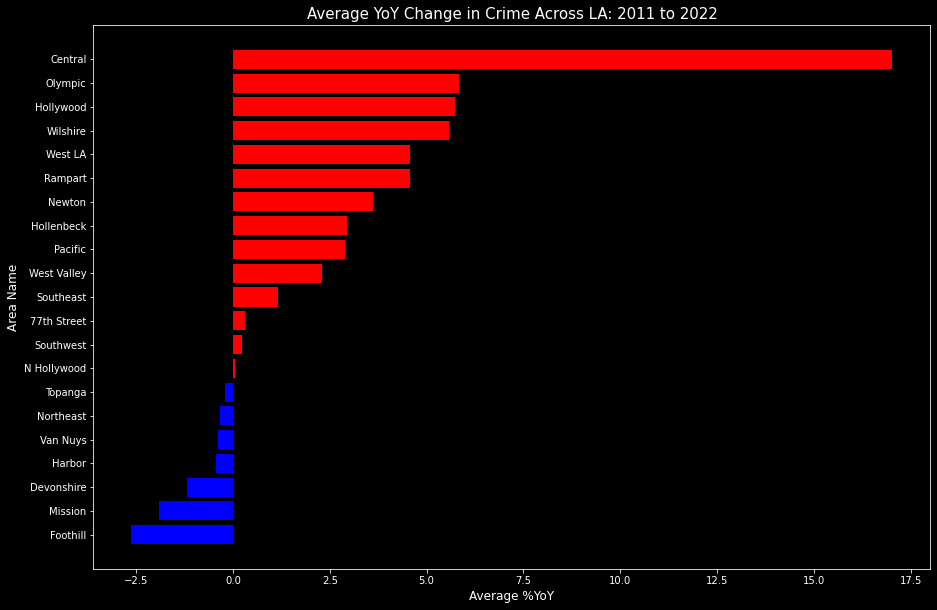

In [27]:
color=[]
for i in yoy_total.sort_values("Avg_YoY").index:
    if yoy_total.loc[i, "Avg_YoY"] > 0:
        color.append("red")
    else:
        color.append("blue")

plt.figure(figsize=(15, 10))
plt.barh(yoy_total.sort_values("Avg_YoY").index, yoy_total.sort_values("Avg_YoY")["Avg_YoY"], 
         color = color)
plt.title(f"Average YoY Change in Crime Across LA: 2011 to 2022", size=15)
plt.ylabel("Area Name", size=12)
plt.xlabel("Average %YoY", size=12)
plt.show()

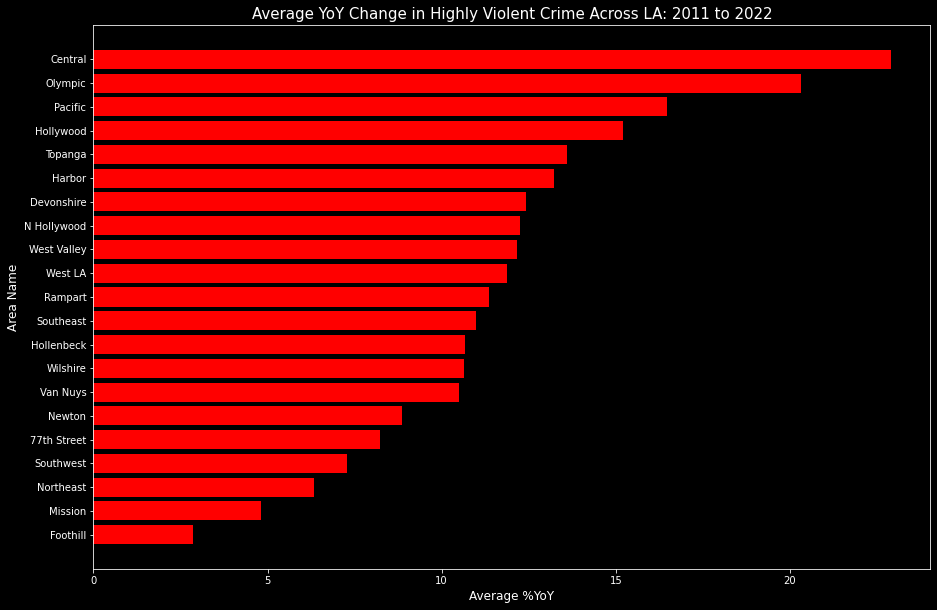

In [28]:
color=[]
for i in yoy_total.sort_values("Avg_YoY_high").index:
    if yoy_total.loc[i, "Avg_YoY_high"] > 0:
        color.append("red")
    else:
        color.append("blue")
plt.figure(figsize=(15, 10))
plt.barh(yoy_total.sort_values("Avg_YoY_high").index, yoy_total.sort_values("Avg_YoY_high")["Avg_YoY_high"], 
         color = color)
plt.title(f"Average YoY Change in Highly Violent Crime Across LA: 2011 to 2022", size=15)
plt.ylabel("Area Name", size=12)
plt.xlabel("Average %YoY", size=12)
plt.show()

The graphs above compares the average year-over-year (YoY) change in annual crime levels between the different regions. Most of the regions have a positive average YoY, meaning their reported crime has been increasing. Central appears to be performing drastically worse than any other region, with an average annual increase of close to 17.5%. Generally, it is expected that if the crime rate of a city is rising, the downtown areas would be more affected than the suburbs. Interestingly, West LA is a safer part of LA, but it is ranked 5th with around 5% average YoY increase, higher than other similar areas. 

When isolating crimes that are "highly violent", average YoY change is positive across all regions, and at a greater rate than for crime in general. This indicates that LA may have been becoming a more violent city. However, 77th Street and Southwest, two regions that see some of the most violence statistically, rank among the bottom for both metrics. Further research may be to see exactly what types of crime are increasing and what may be decreasing for these different regions of interest.

After analyzing the data using a variety of metrics, we get a general idea of how crime distribution throughout the city looks like and which areas are potentially more dangerous than others. Now, we can combine multiple metrics to look for potential patterns, such as clusters of regions that are similar in certain ways.

In [29]:
px.scatter(scatter, "Total_Crime", "Mid+High_Ratio", size="DANGER_LEVEL_NUM", 
           color="DANGER_LEVEL_NUM", hover_name=scatter.index)

The graph above looks at the relationship between total crime, ratio of violent crime, and danger level. It is easy to tell which points represent "more dangerous" regions and which represent "safer" region. Again, the regions near Central LA and South Central LA are all at the top right corner (theoretically more dangerous) while the regions further out, particualrly in the North West direction, occupy the bottom left corner (theoretically less dangerous).

In [30]:
px.scatter(scatter, "Population", "SqMile", size="Total_Crime", color="Total_Crime",
           hover_name=scatter.index)

The graph above looks at the relationship between population, land mass, and total crime. The regions with lower population and land mass are all at or close to downtown LA.

In [31]:
px.scatter(scatter, "Population", "SqMile", size="Mid+High_Ratio", color="Mid+High_Ratio",
           hover_name=scatter.index)

The two graphs above look at the relationship between population, land mass, and crime. As population and/or land mass increase, there is generally a decrease in both crime level and ratio of violent crime, which aligns with the idea that the ultra-urban regions near Central and South Central LA can be seen as more dangerous than their more suburban counterparts.

In [32]:
px.scatter(scatter, "Pop_Density", "SqMile", size="Mid+High_Ratio", color="Mid+High_Ratio",
           hover_name=scatter.index)

In the graph above we can clearly see two clusters. The points on the top left quadrant of the graph are all previously mentioned suburban areas, while the points spread out at the bottom of the graph represent the various regions around Centarl and South Central LA (Topanga is an exception). The urban regions have a wide variance in population density, which may suggest that other elements of the urben environment (socio-economic, cultural, financial, etc.) are important drivers of violent crime in addition to population density.

In [33]:
px.scatter(scatter, "Avg_YoY", "Avg_YoY_high", size="High_Ratio", color="High_Ratio",
           hover_name=yoy_total.index)

The graph above looks that the relationship between growth of crime and growth of highly violent crime. The relationship is generally linear, but we can see that for areas where the ratio of highly violent crime is low (smaller/darker dots), growth of violent crime is actually faster relative to growth of total crime. This may be suggesting that these "safer" areas in LA are in fact becoming slightly more violent over time. However, since the occurance of these highly violent crime are already very low (less than 10% of total crime in these areas), the effects may not have been felt by the public.

## Maps

Finally, we can plot relevant data in a map format to get a better idea of how crime is distributed geographically.

In [34]:
# Combining geographic data to render chloropleth maps.
map_gj = json.load(open("LAPD_Divisions.geojson", "r"))

choropleth_df = scatter.copy()
choropleth_df.reset_index(inplace=True)
choropleth_df.rename(columns={"index": "Area"}, inplace=True)
for i in range(len(choropleth_df)):
    choropleth_df.loc[i, "Area"] = choropleth_df.loc[i, "Area"].upper()
choropleth_df.Area[8] = "NORTH HOLLYWOOD"
choropleth_df.Area[18] = "WEST LOS ANGELES"

area_id_map = {}
for feature in map_gj["features"]:
    feature["id"] = feature["properties"]["PREC"]
    area_id_map[feature["properties"]["APREC"]] = feature["id"]

choropleth_df["id"] = choropleth_df["Area"].apply(lambda x: area_id_map[x])

C:\Users\chiuy\AppData\Local\Temp/ipykernel_10064/672347221.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\chiuy\AppData\Local\Temp/ipykernel_10064/672347221.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [35]:
fig = px.choropleth_mapbox(choropleth_df, 
                    locations="id", 
                    geojson=map_gj, 
                    color="DANGER_LEVEL_NUM",
                    hover_name="Area",
                    hover_data=["Population", "SqMile", "Total_Crime"],
                    mapbox_style="open-street-map", # stamen-toner is no longer free
                    center={"lat": 34, "lon": -118.5},
                    zoom=8.3,
                    opacity=0.8,
                    color_continuous_scale="thermal",
                    title="Chloropleth Map of Relative Danger Levels"
                    )
fig.show()

In [36]:
fig = px.choropleth_mapbox(choropleth_df, 
                    locations="id", 
                    geojson=map_gj, 
                    color="Mid+High_Ratio",
                    hover_name="Area",
                    hover_data=["Population", "SqMile", "Total_Crime"],
                    mapbox_style="open-street-map", # stamen-toner is no longer free
                    center={"lat": 34, "lon": -118.5},
                    zoom=8.3,
                    opacity=0.8,
                    color_continuous_scale="thermal",
                    title="Chloropleth Map of Violent Crime Ratio"
                    )
fig.show()

From the two chloropleth maps above, we can clearly see that the previously identified areas that are considered more dangerous run from Hollywood, down through Central LA (Rampart, Olympic, Central), and ending at South Central LA (Southwest, Southeast, Newton, 77th Street). These areas have relatively higher levels of crime as well as higher ratios of violent crime as seen by their brighter colors.

These maps show the previously mentioned "holes" for regions that are not technically part of LA City and thus out of LAPD jurisdiction. Among them, Compton and Inglewood are two cities that are basically right beside South Central LA. They are also notorious for high crime rates and public safety issues, so their data might very well be similar to those of their South Central neighbours.

In [37]:
px.density_mapbox(crime_clean[(crime_clean["DATE"]>="2022-03-21")&(crime_clean["DATE"]<="2022-03-27")], 
                  lat="LAT", lon="LON", z="DANGER_LEVEL_NUM",
                  mapbox_style="open-street-map",
                  center={"lat": 34, "lon": -118.5}, zoom=9,
                  hover_data={"LAT": False, "LON": False, "AREA_NAME": True, "CRIME_GROUP": True},
                  height=800,
                  title="Crime Density Heatmap")


Above is a density heatmap created using a week's worth of reported crime. The datapoints are weighted using the danger level of each crime. As you zoom in, you can start to see which areas are "hotter", indicating more concentrated cases of crime as well as more dangerous crimes. The previously mentioned areas starting from Hollywood moving south through Central LA and then South Central LA are much "hotter" than their surroundings.

## Interesting Additional Findings

Below are some additional insight I had while cleaning and making sense of the arrest dataset.

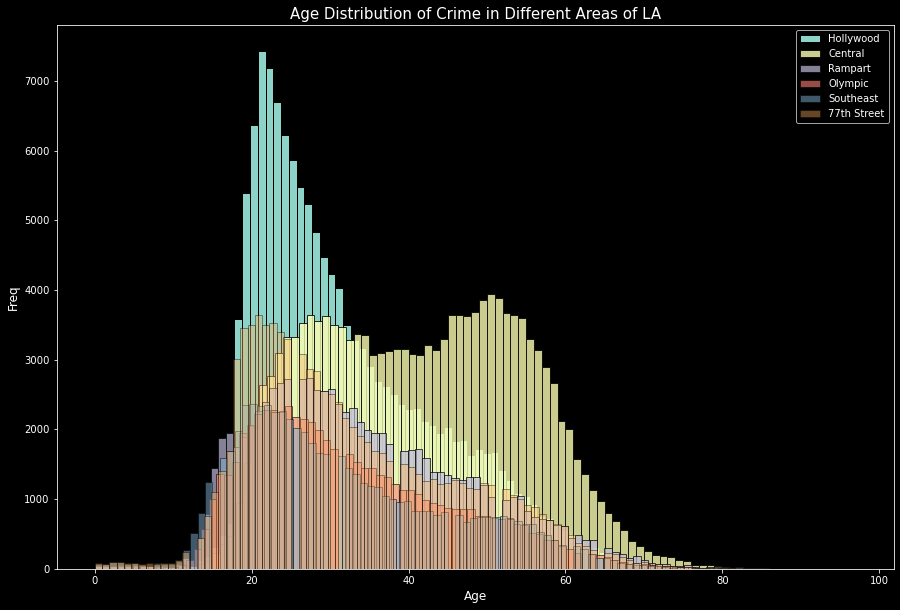

In [38]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.hist(arrest_clean[arrest_clean["AREA_NAME"]=="Hollywood"]["AGE"], bins=97, edgecolor="black",
       label="Hollywood")
ax.hist(arrest_clean[arrest_clean["AREA_NAME"]=="Central"]["AGE"], bins=97, edgecolor="black", alpha=0.8,
       label="Central")
ax.hist(arrest_clean[arrest_clean["AREA_NAME"]=="Rampart"]["AGE"], bins=97, edgecolor="black", alpha=0.7,
       label="Rampart")
ax.hist(arrest_clean[arrest_clean["AREA_NAME"]=="Olympic"]["AGE"], bins=97, edgecolor="black", alpha=0.6,
       label="Olympic")
ax.hist(arrest_clean[arrest_clean["AREA_NAME"]=="Southeast"]["AGE"], bins=97, edgecolor="black", alpha=0.5,
       label="Southeast")
ax.hist(arrest_clean[arrest_clean["AREA_NAME"]=="77th Street"]["AGE"], bins=97, edgecolor="black", alpha=0.4,
       label="77th Street")
ax.legend()
ax.set_title("Age Distribution of Crime in Different Areas of LA", size=15)
ax.set_xlabel("Age", size=12)
ax.set_ylabel("Freq", size=12)
plt.show()

I plotted the histograms of perpatrator age from the areas with high arrest rates (which also happen to be the areas previously described as more dangerous). Most of the histograms follow a similar distribution of heavy right skew with a single peak at around 21-25 years old, meaning that the majority of the arrested are young people. However, the histogram for Central stood out as it is neither right skewed nor single-peaked like the rest. It has one peak at around 30 years old and another at around 55 years old, meaning the arrested demographic is very different from all the other regions. 

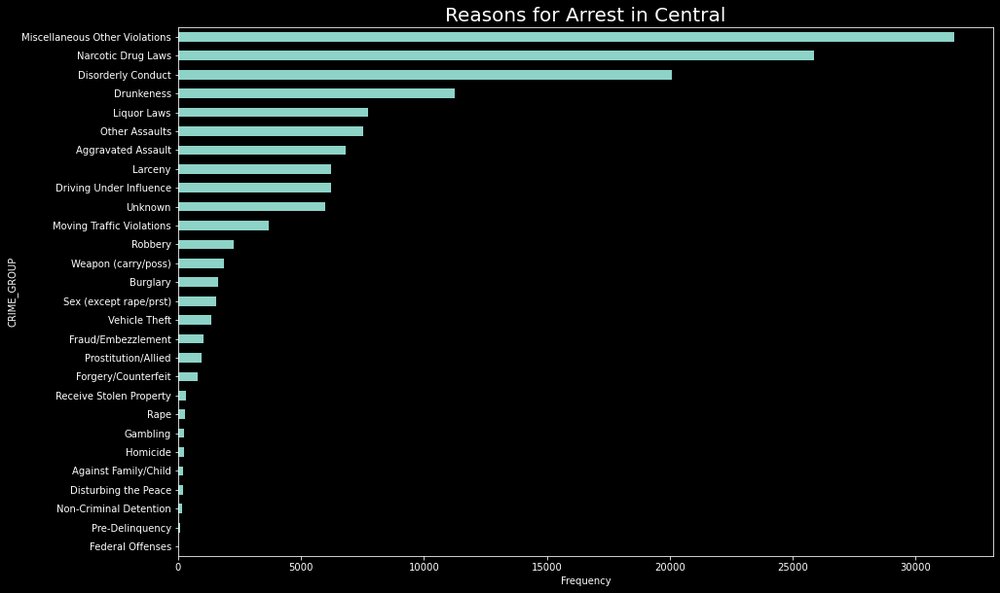

In [39]:
arrest_clean[arrest_clean["AREA_NAME"]=="Central"].groupby("CRIME_GROUP")[
    "ARREST_ID"].count().sort_values().plot(kind="barh", figsize=(15, 10))
plt.title("Reasons for Arrest in Central", size=20)
plt.xlabel("Frequency")
plt.show()

To investigate this outlier, I looked at what types of crime are associated with the arrests in Central. Ignoring misc. violations, the primary causes seem to be drugs, liquor, disorderly conduct, and then violence. Larceny ranks relatively low here in comparison to some of the other regions (such as Hollywood).

In [40]:
f = arrest_clean[arrest_clean["AREA_NAME"]=="Central"]["CHARGE_DESCRIPTION"].value_counts()
wordcloud = wc(width = 2000, height = 1000, colormap="Wistia").generate_from_frequencies(f[f > 1000])

fig6 = px.imshow(wordcloud, title="Most Common Incident Descriptions for Centarl")
fig6.update_traces(hovertemplate=None,
                  hoverinfo="skip")
fig6.update_xaxes(visible=False)
fig6.update_yaxes(visible=False)

Since there are too many specific crime descriptions to properly group and analyze, I thought a quick and easy way to get a big picture would be through a word cloud of the most common crime descriptions. Apart from numerous crimes related to drugs and liqour, the most insightful descriptions are "Sit/Lie/Sleep Sidewalk or Street" and "Illegel Posession of Shopping Cart". These two charges apply almost exclusively to the homeless population, of which downtown LA has quite a large number of. Their demographics are also typically older, and many suffer from alcohol and drug addictions.

Final note: the homeless issue in LA is an entirely different topic and an important one. Even though they are often treated as "invisible people", the impact they have on society can be clearly seen through this brief data exploration.